# **Trabalho DLVC**
- David Carvalho, nº2242131
- Lígia Carteado Mena, nº2242194
- Rui Filipe Parada, nº2211025

#**1. Imports | Upload das imagens**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import zipfile
import os
from google.colab import files

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, GlobalAveragePooling2D, UpSampling2D
from keras.applications import VGG16, MobileNetV2
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from sklearn.metrics import confusion_matrix, classification_report


In [ ]:
uploaded = files.upload()


Saving image_classification.zip to image_classification.zip


In [ ]:
zip_path = "image_classification.zip"
extract_path = "/content/image_classification"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [ ]:
train_dir = "/content/image_classification/dataset_train"
test_dir = "/content/image_classification/dataset_test"

In [ ]:
# Verify extraction
print(os.listdir('/content/image_classification'))

# Now list the contents of train_dir
print((train_dir))

['dataset_train', 'dataset_test']
/content/image_classification/dataset_train


"cats" - class 0



"dogs" - class 1





Found 10000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


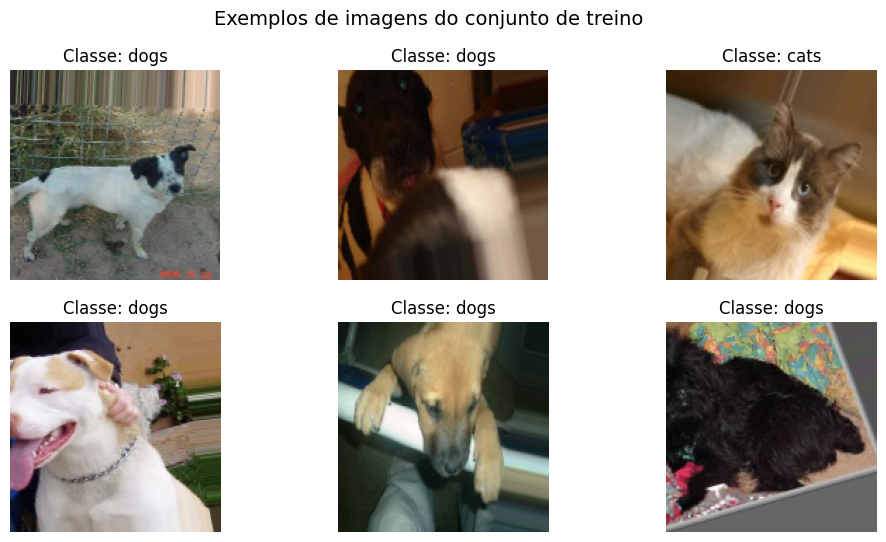

In [ ]:
# Parâmetros
img_size = (150, 150)
batch_size = 32
epochs = 20

# Geradores de Imagens com Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=img_size, batch_size=batch_size, class_mode='binary')

test_generator = test_datagen.flow_from_directory(
    test_dir, target_size=img_size, batch_size=batch_size, class_mode='binary', shuffle=False)



def show_sample_images(generator):
    class_names = list(generator.class_indices.keys())
    images, labels = next(generator)
    plt.figure(figsize=(12, 6))
    for i in range(6):
        plt.subplot(2, 3, i+1)
        plt.imshow(images[i])
        label = int(labels[i])
        plt.title(f"Classe: {class_names[label]}")
        plt.axis('off')
    plt.suptitle("Exemplos de imagens do conjunto de treino", fontsize=14)
    plt.show()

show_sample_images(train_generator)


#**2. Defs dos modelos**

<ipython-input-8-8a255cc01b8c>:59: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))



Treino do modelo: CNN Simples

Epoch 1/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 73s 223ms/step - accuracy: 0.5314 - loss: 0.7310 - val_accuracy: 0.5830 - val_loss: 0.6754
Epoch 2/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 65s 207ms/step - accuracy: 0.5624 - loss: 0.6834 - val_accuracy: 0.5820 - val_loss: 0.6650
Epoch 3/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 65s 208ms/step - accuracy: 0.5780 - loss: 0.6763 - val_accuracy: 0.6420 - val_loss: 0.6349
Epoch 4/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 66s 212ms/step - accuracy: 0.6299 - loss: 0.6500 - val_accuracy: 0.6770 - val_loss: 0.6042
Epoch 5/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 64s 203ms/step - accuracy: 0.6334 - loss: 0.6408 - val_accuracy: 0.6440 - val_loss: 0.6227
Epoch 6/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 83s 207ms/step - accuracy: 0.6551 - loss: 0.6226 - val_accuracy: 0.7020 - val_loss: 0.5769
Epoch 7/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 66s 209ms/step - accuracy: 0.6735 - loss: 0.6045 - val_accuracy: 0.7310 - val_loss: 0.5466
Epoch 8/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 65s 206ms/s

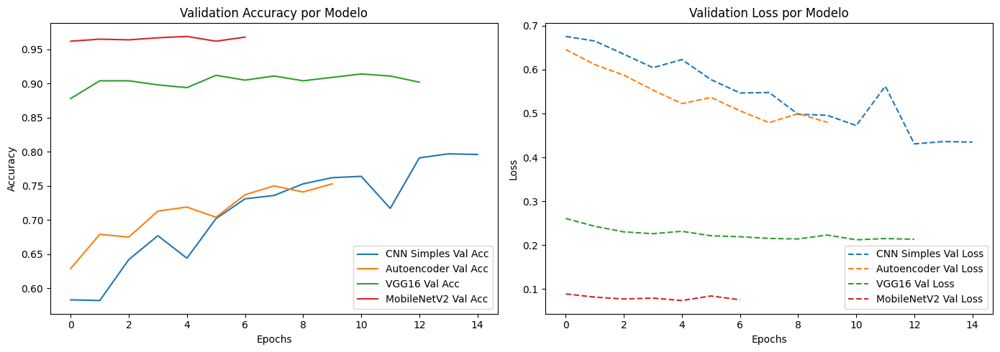

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


<ipython-input-8-8a255cc01b8c>:143: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pred_label = class_names[int(preds[i] > 0.5)]


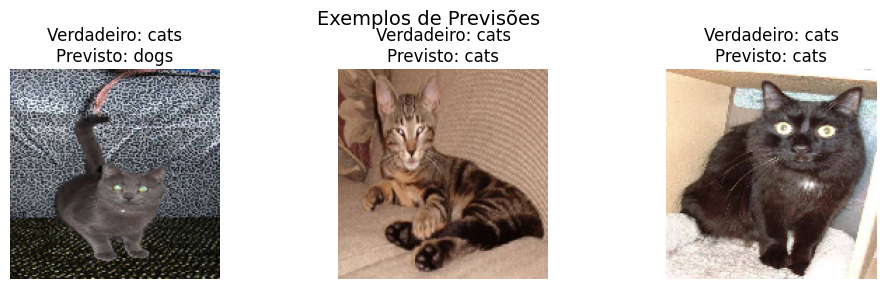

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


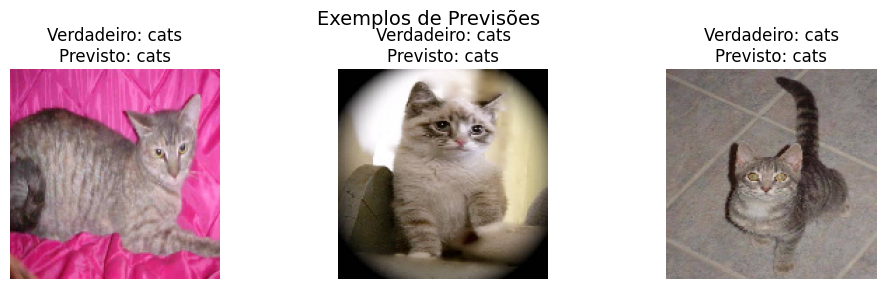

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step


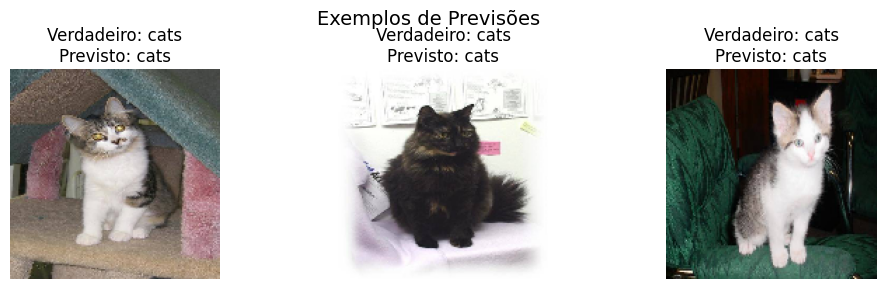

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


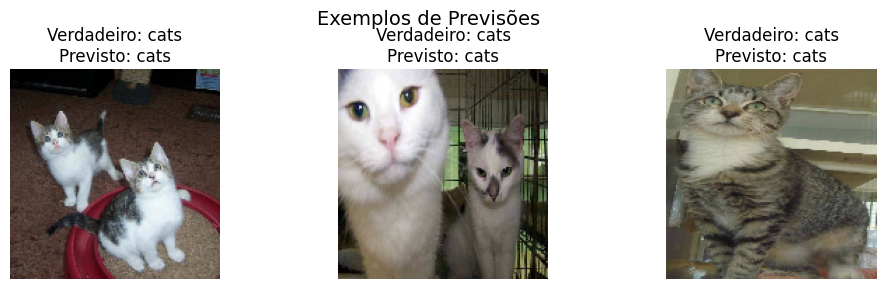

In [ ]:
# Modelo CNN Simples
def create_simple_cnn():
    model = Sequential([
        keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
        keras.layers.MaxPooling2D(2,2),
        keras.layers.Conv2D(64, (3,3), activation='relu'),
        keras.layers.MaxPooling2D(2,2),
        keras.layers.Conv2D(128, (3,3), activation='relu'),
        keras.layers.MaxPooling2D(2,2),
        keras.layers.Flatten(),
        keras.layers.Dense(512, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model



# AutoEncoder
def create_autoencoder_classifier():
    input_img = keras.Input(shape=(150, 150, 3))

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    encoded = MaxPooling2D((2, 2), padding='same')(x)
    x = Flatten()(encoded)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=input_img, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model



# Transfer Learning com VGG16
def create_vgg16_model():
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
    for layer in base_model.layers:
        layer.trainable = False
    model = Sequential([
        base_model,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model



# Transfer Learning com MobileNetV2
def create_mobilenet_model():
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
    base_model.trainable = False
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model



# Função de treino com EarlyStopping, ModelCheckpoint e TensorBoard
def train_and_evaluate(model, name):
    print(f"\nTreino do modelo: {name}\n")

    # Diretório do TensorBoard
    log_dir = os.path.join("logs", name + "_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True),
        ModelCheckpoint(f"{name.lower().replace(' ', '_')}.keras", monitor='val_loss', save_best_only=True),
        TensorBoard(log_dir=log_dir)
    ]

    history = model.fit(
        train_generator,
        validation_data=test_generator,
        epochs=epochs,
        callbacks=callbacks
    )
    return history

models = {
    "CNN Simples": create_simple_cnn(),
    "Autoencoder": create_autoencoder_classifier(),
    "VGG16": create_vgg16_model(),
    "MobileNetV2": create_mobilenet_model()
}

histories = {}
for name, model in models.items():
    histories[name] = train_and_evaluate(model, name)



def plot_history(histories):
    plt.figure(figsize=(14, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    for name, history in histories.items():
        plt.plot(history.history['val_accuracy'], label=f'{name} Val Acc')
    plt.title('Validation Accuracy por Modelo')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    for name, history in histories.items():
        plt.plot(history.history['val_loss'], label=f'{name} Val Loss', linestyle='--')
    plt.title('Validation Loss por Modelo')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_history(histories)



# Visualizar 6 imagens do conjunto de teste com previsões de cada modelo
def show_predictions(model, generator):
    class_names = list(generator.class_indices.keys())
    images, labels = next(generator)
    preds = model.predict(images)
    plt.figure(figsize=(12, 6))
    for i in range(3):
        plt.subplot(2, 3, i+1)
        plt.imshow(images[i])
        true_label = class_names[int(labels[i])]
        pred_label = class_names[int(preds[i] > 0.5)]
        plt.title(f"Verdadeiro: {true_label}\nPrevisto: {pred_label}")
        plt.axis('off')
    plt.suptitle("Exemplos de Previsões", fontsize=14)
    plt.show()

show_predictions(models["CNN Simples"], test_generator)
show_predictions(models["Autoencoder"], test_generator)
show_predictions(models["VGG16"], test_generator)
show_predictions(models["MobileNetV2"], test_generator)


#**3. TensorBoard**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

#**4. Avaliação final**


Avaliação final - CNN Simples


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step
              precision    recall  f1-score   support

        Gato       0.83      0.73      0.78       500
         Cão       0.76      0.85      0.80       500

    accuracy                           0.79      1000
   macro avg       0.79      0.79      0.79      1000
weighted avg       0.79      0.79      0.79      1000



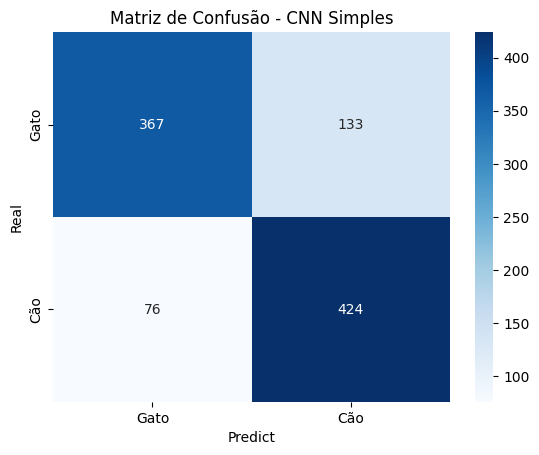


Avaliação final - Autoencoder
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step
              precision    recall  f1-score   support

        Gato       0.71      0.84      0.77       500
         Cão       0.80      0.66      0.73       500

    accuracy                           0.75      1000
   macro avg       0.76      0.75      0.75      1000
weighted avg       0.76      0.75      0.75      1000



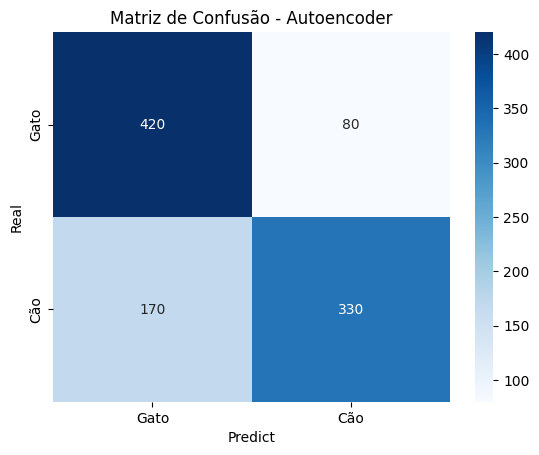


Avaliação final - VGG16
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step
              precision    recall  f1-score   support

        Gato       0.92      0.91      0.91       500
         Cão       0.91      0.92      0.91       500

    accuracy                           0.91      1000
   macro avg       0.91      0.91      0.91      1000
weighted avg       0.91      0.91      0.91      1000



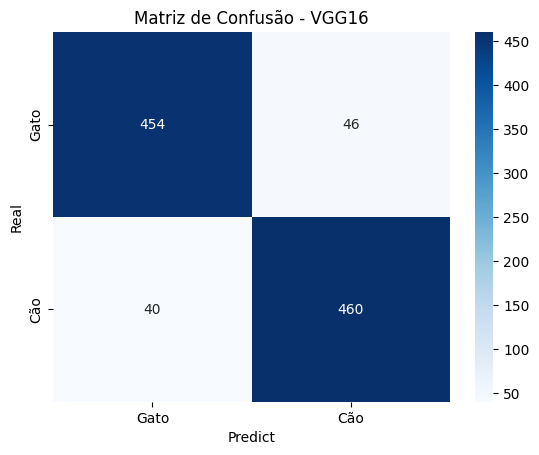


Avaliação final - MobileNetV2
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step
              precision    recall  f1-score   support

        Gato       0.97      0.97      0.97       500
         Cão       0.97      0.97      0.97       500

    accuracy                           0.97      1000
   macro avg       0.97      0.97      0.97      1000
weighted avg       0.97      0.97      0.97      1000



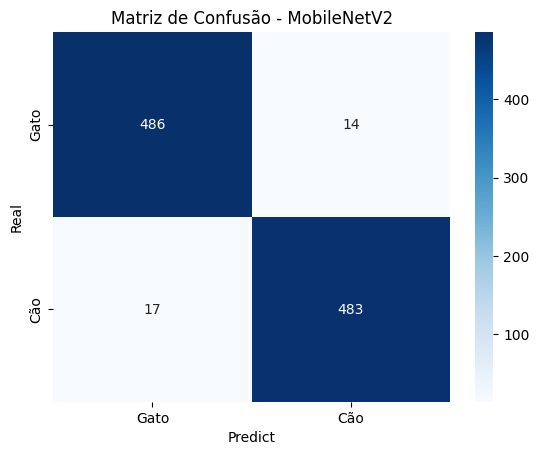

In [ ]:
def evaluate_model(model, name):
    print(f"\nAvaliação final - {name}")
    y_true = test_generator.classes
    y_pred = (model.predict(test_generator) > 0.5).astype("int32").flatten()

    print(classification_report(y_true, y_pred, target_names=["Gato", "Cão"]))

    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=["Gato", "Cão"], yticklabels=["Gato", "Cão"])
    plt.title(f"Matriz de Confusão - {name}")
    plt.xlabel("Predict")
    plt.ylabel("Real")
    plt.show()

# Avaliar todos os modelos após treino
for name, model in models.items():
    evaluate_model(model, name)


#**5. Conclusão**

O desafio proposto consistiu em desenvolver um modelo de classificação binária de imagens, capaz de distinguir entre cães e gatos.
Após o carregamento dos dados fornecidos, recorreu-se ao ImageDataGenerator para normalizar, redimensionar e aplicar transformações nas imagens, com o objetivo de reduzir o risco de overfitting durante as fases de treino, validação e teste.

Em seguida e de forma a identificar a abordagem mais eficiente e eficaz para o problema em causa, foram testadas 3 abordagens diferentes:

- 1 - Modelo Convencional - CNN simples

- 2 - Modelo personalizado – Encoder + classificador

- 3 - Transfer Learning – com o uso de 2 modelos pré-treinados: o VGG16 e o MobileNetV2

Na fase de treino usou-se “Adam” como otimizador e como critério de loss, o binary crossentropy. Durante o treino usaram-se ainda:

-	O EarlyStopping para interromper o treino e poupar tempo de computação, quando a performance na validação deixava de melhorar (detetou-se que os modelos estavam a treinar sem ganhos reais de desempenho);

-	ModelCheckpoint para guardar o melhor modelo.

Os resultados foram monitorizados com o TensorBoard e para avaliação dos modelos, recorreu-se à métrica accuracy, à Confusion Matrix e ao Classification Report onde constam outras métricas como: precisão, recall e F1-score.
Adicionalmente, foram gerados gráficos (loss e accuracy) e exemplos visuais com previsões reais, permitindo uma análise mais intuitiva da performance de cada abordagem. Por exemplo, verificou-se que o modelo “CNN simples” classificou um “gato” como “cão”, no entanto estamos perante um dos modelos que obteve pior desempenho.

Em resumo e com base nos resultados obtidos, o modelo com melhor desempenho foi o MobileNetV2, destacando-se pela alta accuracy, baixa loss e excelente desempenho nas métricas de recall e F1-score. Acresce a rapidez de treino, pois só precisou de 6 epochs para atingir o seu melhor desempenho. Trata-se, assim, da solução mais eficaz para a tarefa de classificação entre cães e gatos neste contexto.